In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('C:/Users/prati/Downloads/creditcard_2023.csv')

In [5]:
df.head()

,id,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,-0.130006,0.727159,...,-0.110552,0.217606,-0.134794,0.165959,0.126280,-0.434824,-0.081230,-0.151045,17982.10,0
1,1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,-0.133118,0.347452,...,-0.194936,-0.605761,0.079469,-0.577395,0.190090,0.296503,-0.248052,-0.064512,6531.37,0
2,2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.095576,-0.261297,...,-0.005020,0.702906,0.945045,-1.154666,-0.605564,-0.312895,-0.300258,-0.244718,2513.54,0
3,3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.065130,-0.205698,...,-0.146927,-0.038212,-0.214048,-1.893131,1.003963,-0.515950,-0.165316,0.048424,5384.44,0
4,4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,-0.212660,1.049921,...,-0.106984,0.729727,-0.161666,0.312561,-0.414116,1.071126,0.023712,0.419117,14278.97,0


In [6]:
df.shape

(568630, 31)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568630 entries, 0 to 568629
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      568630 non-null  int64  
 1   V1      568630 non-null  float64
 2   V2      568630 non-null  float64
 3   V3      568630 non-null  float64
 4   V4      568630 non-null  float64
 5   V5      568630 non-null  float64
 6   V6      568630 non-null  float64
 7   V7      568630 non-null  float64
 8   V8      568630 non-null  float64
 9   V9      568630 non-null  float64
 10  V10     568630 non-null  float64
 11  V11     568630 non-null  float64
 12  V12     568630 non-null  float64
 13  V13     568630 non-null  float64
 14  V14     568630 non-null  float64
 15  V15     568630 non-null  float64
 16  V16     568630 non-null  float64
 17  V17     568630 non-null  float64
 18  V18     568630 non-null  float64
 19  V19     568630 non-null  float64
 20  V20     568630 non-null  float64
 21  V21     56

In [3]:
df.drop('id',axis=1,inplace=True)

In [4]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
df.Amount=sc.fit_transform(df.Amount.values.reshape(-1, 1))

#EDA

<AxesSubplot:>

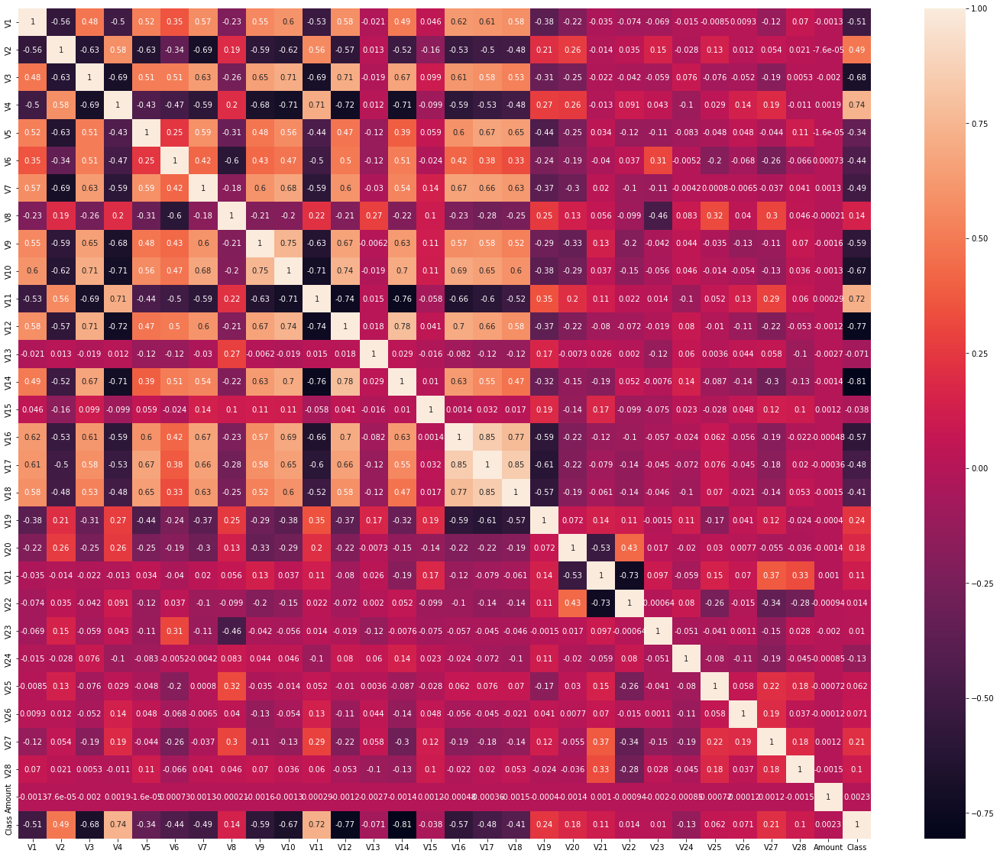

In [10]:
corr=df.corr()
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True)

Text(0.5, 1.0, 'Fradulent VS Non-Fradulent')

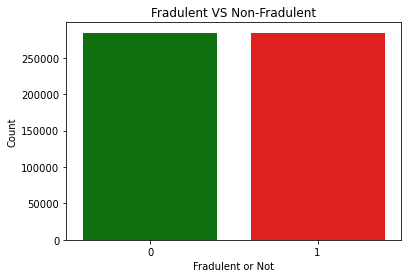

In [11]:
sns.countplot(x='Class',data=df,palette=['g', 'r'])
plt.xlabel("Fradulent or Not")
plt.ylabel("Count")
plt.title("Fradulent VS Non-Fradulent")

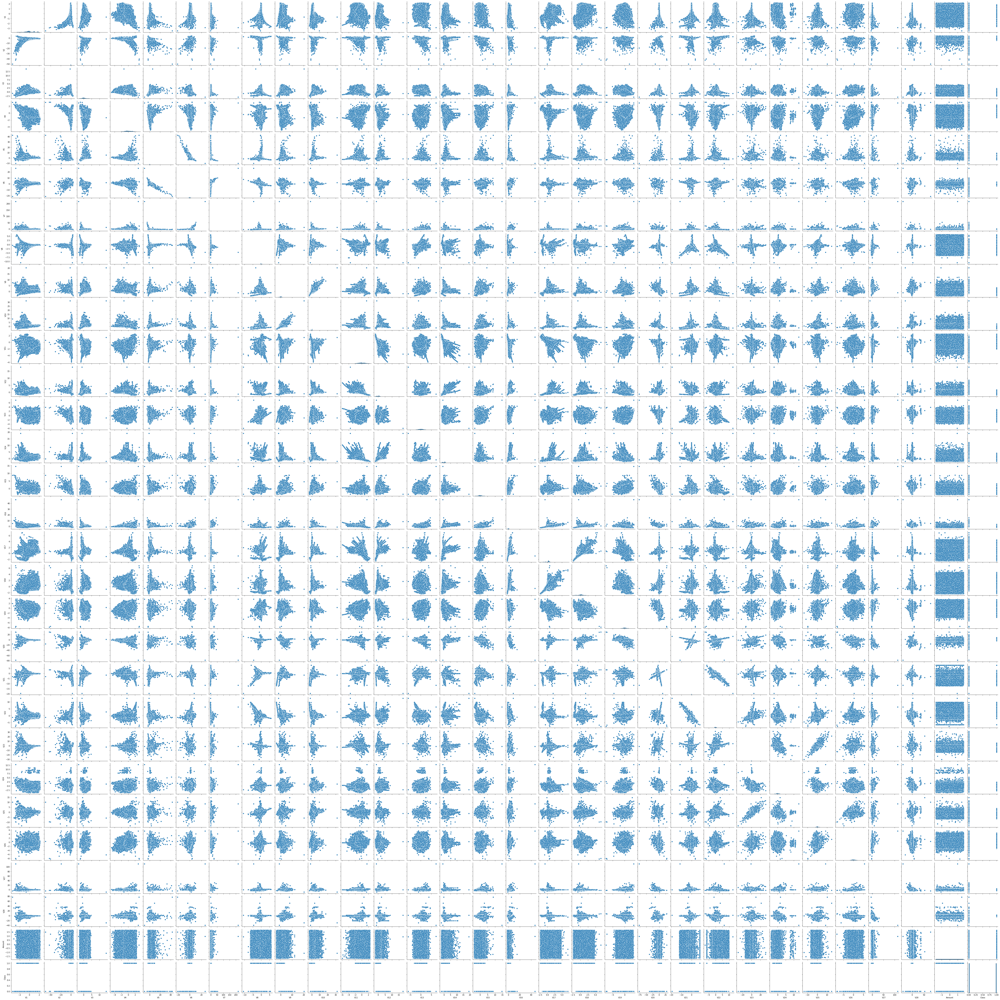

In [12]:
sns.pairplot(df)

In [5]:
# Independent Variable
x=df.drop('Class',axis=1)

# Dependent Variable
y=df.Class

In [10]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0)

In [18]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression()
lr.fit(x_train,y_train)

LogisticRegression()

In [19]:
y_pred=lr.predict(x_test)
y_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [20]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

accuracy_score(y_test,y_pred)

0.9578167408215067

In [10]:
confusion_matrix(y_test,y_pred)

array([[83252,  1920],
       [ 4059, 81358]], dtype=int64)

In [11]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97     85172
           1       0.98      0.95      0.96     85417

    accuracy                           0.96    170589
   macro avg       0.97      0.96      0.96    170589
weighted avg       0.97      0.96      0.96    170589



In [12]:
!pip install imbalanced-learn

In [13]:
from imblearn.over_sampling import SMOTE

In [36]:
smote = SMOTE(random_state=42)
x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)


In [37]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression()
lr.fit(x_train_resampled,y_train_resampled)

LogisticRegression()

In [38]:
y_pred=lr.predict(x_test)
y_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [39]:
accuracy_score(y_test,y_pred)

0.9649684329001283

In [40]:
confusion_matrix(y_test,y_pred)

array([[83251,  1921],
       [ 4055, 81362]], dtype=int64)

In [41]:
from imblearn.over_sampling import RandomOverSampler

In [43]:
oversampler = RandomOverSampler(random_state=42)
x_train_resampled, y_train_resampled = oversampler.fit_resample(x_train, y_train)

In [44]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression()
lr.fit(x_train_resampled,y_train_resampled)

LogisticRegression()

In [45]:
y_pred=lr.predict(x_test)
y_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [46]:
accuracy_score(y_test,y_pred)

0.9649684329001283

In [47]:
from imblearn.under_sampling import RandomUnderSampler

In [49]:
undersampler = RandomUnderSampler(random_state=42)
x_train_resampled, y_train_resampled = undersampler.fit_resample(x_train, y_train)

In [50]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression()
lr.fit(x_train_resampled,y_train_resampled)

LogisticRegression()

In [51]:
y_pred=lr.predict(x_test)
y_pred

array([1, 1, 1, ..., 1, 0, 1], dtype=int64)

In [52]:
accuracy_score(y_test,y_pred)

0.9649567088147536

In [8]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_entropy=200,)
rf.fit(x_train,y_train)

TypeError: __init__() got an unexpected keyword argument 'n_entropy'

In [10]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2)
x_poly = poly.fit_transform(x)

In [12]:
x_train,x_test,y_train,y_test = train_test_split(x_poly,y,test_size=0.3,random_state=0)

In [16]:
from sklearn.linear_model import LogisticRegression

lr=LogisticRegression(solver='sag')
lr.fit(x_train,y_train)

C:\Users\prati\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LogisticRegression(solver='sag')

In [ ]:
y_pred=lr.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [44]:
lr=LogisticRegression(C=0.000001)
lr.fit(x_train,y_train)

LogisticRegression(C=1e-06)

In [45]:
y_pred=lr.predict(x_test)

In [46]:
accuracy_score(y_test,y_pred)

0.9078662750822152

In [41]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()
nb.fit(x_train,y_train)

GaussianNB()

In [42]:
y_pred=nb.predict(x_test)

In [43]:
accuracy_score(y_test,y_pred)

0.9186993299685209

In [47]:
from sklearn.svm import SVC

In [48]:
svm = SVC(kernel="rbf")
svm.fit(x_train,y_train)

SVC()

In [49]:
y_pred=svm.predict(x_test)

In [50]:
accuracy_score(y_test,y_pred)

0.9967172560950589

In [6]:
a=df.corr()['Class']
a

V1       -0.505761
V2        0.491878
V3       -0.682095
V4        0.735981
V5       -0.338639
V6       -0.435088
V7       -0.491234
V8        0.144294
V9       -0.585522
V10      -0.673665
V11       0.724278
V12      -0.768579
V13      -0.071105
V14      -0.805669
V15      -0.037948
V16      -0.573511
V17      -0.476377
V18      -0.410091
V19       0.244081
V20       0.179851
V21       0.109640
V22       0.014098
V23       0.010255
V24      -0.130107
V25       0.061847
V26       0.071052
V27       0.214002
V28       0.102024
Amount    0.002261
Class     1.000000
Name: Class, dtype: float64

In [7]:
ind=a[a.abs()>0.5].index
ind

Index(['V1', 'V3', 'V4', 'V9', 'V10', 'V11', 'V12', 'V14', 'V16', 'Class'], dtype='object')

In [45]:
ind1=a[a.abs()>0.3].index
ind1

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'Class'],
      dtype='object')

In [8]:
sel=df[ind].drop('Class',axis=1)
sel

,V1,V3,V4,V9,V10,V11,V12,V14,V16
0,-0.260648,2.496266,-0.083724,0.727159,0.637735,-0.987020,0.293438,0.549020,0.215598
1,0.985100,0.558056,-0.429654,0.347452,0.529808,0.140107,1.564246,0.627719,0.789188
2,-0.260272,1.728538,-0.457986,-0.261297,0.690708,-0.272985,0.659201,0.616874,-0.577514
3,-0.152152,1.746840,-1.090178,-0.205698,0.575231,-0.752581,0.737483,0.559535,-0.030669
4,-0.206820,1.527053,-0.448293,1.049921,0.968046,-1.203171,1.029577,0.241454,0.224538
...,...,...,...,...,...,...,...,...,...
568625,-0.833437,-0.899794,0.904227,-0.938153,-1.161847,1.430971,-1.330500,-1.363454,-1.480796
568626,-0.670459,-0.068129,-0.267328,0.483894,-0.210817,0.173590,-0.539948,-0.812043,-0.545184
568627,-0.311997,0.137526,-0.035893,-0.122048,-0.144495,0.477582,-0.461849,-0.395126,-0.370201
568628,0.636871,-0.300889,-0.144480,0.893527,-0.080078,-0.324934,0.335215,-0.390369,0.477402


In [46]:
sel1=df[ind1].drop('Class',axis=1)
sel1

,V1,V2,V3,V4,V5,V6,V7,V9,V10,V11,V12,V14,V16,V17,V18
0,-0.260648,-0.469648,2.496266,-0.083724,0.129681,0.732898,0.519014,0.727159,0.637735,-0.987020,0.293438,0.549020,0.215598,0.512307,0.333644
1,0.985100,-0.356045,0.558056,-0.429654,0.277140,0.428605,0.406466,0.347452,0.529808,0.140107,1.564246,0.627719,0.789188,0.403810,0.201799
2,-0.260272,-0.949385,1.728538,-0.457986,0.074062,1.419481,0.743511,-0.261297,0.690708,-0.272985,0.659201,0.616874,-0.577514,0.886526,0.239442
3,-0.152152,-0.508959,1.746840,-1.090178,0.249486,1.143312,0.518269,-0.205698,0.575231,-0.752581,0.737483,0.559535,-0.030669,0.242629,2.178616
4,-0.206820,-0.165280,1.527053,-0.448293,0.106125,0.530549,0.658849,1.049921,0.968046,-1.203171,1.029577,0.241454,0.224538,0.366466,0.291782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568625,-0.833437,0.061886,-0.899794,0.904227,-1.002401,0.481454,-0.370393,-0.938153,-1.161847,1.430971,-1.330500,-1.363454,-1.480796,-1.520928,-1.376970
568626,-0.670459,-0.202896,-0.068129,-0.267328,-0.133660,0.237148,-0.016935,0.483894,-0.210817,0.173590,-0.539948,-0.812043,-0.545184,-0.575991,-0.664313
568627,-0.311997,-0.004095,0.137526,-0.035893,-0.042291,0.121098,-0.070958,-0.122048,-0.144495,0.477582,-0.461849,-0.395126,-0.370201,-0.729002,-0.251679
568628,0.636871,-0.516970,-0.300889,-0.144480,0.131042,-0.294148,0.580568,0.893527,-0.080078,-0.324934,0.335215,-0.390369,0.477402,0.848443,0.930280


In [11]:
x_train,x_test,y_train,y_test = train_test_split(sel,y,test_size=0.3,random_state=0)

In [100]:
lr=LogisticRegression(C=0.0000001)
lr.fit(x_train,y_train)

LogisticRegression(C=1e-07)

In [101]:
y_pred=lr.predict(x_test)

In [102]:
accuracy_score(y_test,y_pred)

0.9180603673155948

In [104]:
from sklearn.ensemble  import RandomForestClassifier

In [105]:
rf=RandomForestClassifier(n_estimators=200)
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=200)

In [106]:
y_pred = rf.predict(x_test)

In [108]:
accuracy_score(y_test,y_pred)

0.9995720708838202

In [110]:
!pip install xgboost

In [111]:
import xgboost as xgb

xg = xgb.XGBClassifier(random_state=1)
xg.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

In [112]:
y_pred = rf.predict(x_test)

In [113]:
accuracy_score(y_test,y_pred)

0.9995720708838202

In [114]:
from sklearn.naive_bayes import GaussianNB
gb=GaussianNB()
gb.fit(x_train,y_train)

GaussianNB()

In [115]:
y_pred = rf.predict(x_test)

In [116]:
accuracy_score(y_test,y_pred)

0.9995720708838202

In [122]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier(n_neighbors=5,metric='minkowski')
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [123]:
y_pred=knn.predict(x_test)

In [125]:
accuracy_score(y_test,y_pred)

0.9979834573155362

C:\Users\prati\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\prati\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\prati\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\prati\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of

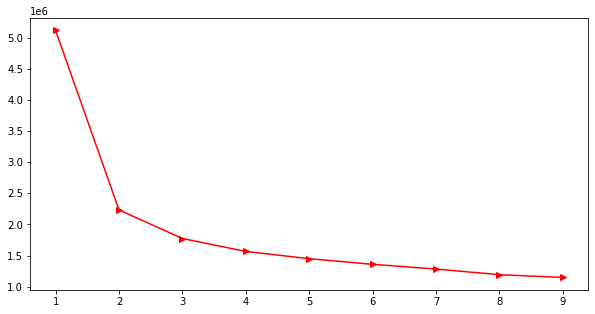

In [187]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1,10):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=0)
  kmeans.fit(sel.values)
  wcss.append(kmeans.inertia_)

plt.figure(figsize=(10,5))
plt.plot(range(1,10),wcss,'r>-')

In [35]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=3,random_state=0)
kmeans.fit(sel.values)

C:\Users\prati\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=3, random_state=0)

In [36]:
def converter(cluster):
  if cluster==1:
    return 1
  else:
    return 0

In [37]:
df1=df

In [39]:
df1['Cluster'] = df['Class'].apply(converter)

In [40]:
cm = confusion_matrix(df1['Cluster'],kmeans.labels_)
cm

array([[    95, 284193,     27],
       [168124,  46020,  70171],
       [     0,      0,      0]], dtype=int64)

In [44]:
print(classification_report(df1['Cluster'],kmeans.labels_))

C:\Users\prati\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00    284315
           1       0.14      0.16      0.15    284315
           2       0.00      0.00      0.00         0

    accuracy                           0.08    568630
   macro avg       0.05      0.05      0.05    568630
weighted avg       0.07      0.08      0.08    568630



C:\Users\prati\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\prati\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [47]:
############################################################################################

In [48]:
x_train,x_test,y_train,y_test = train_test_split(sel,y,test_size=0.3,random_state=0)

In [49]:
lr=LogisticRegression(C=0.0000001)
lr.fit(x_train,y_train)

LogisticRegression(C=1e-07)

In [50]:
y_pred=lr.predict(x_test)

In [51]:
accuracy_score(y_test,y_pred)

0.9180603673155948

In [52]:
from sklearn.ensemble  import RandomForestClassifier

In [ ]:
rf=RandomForestClassifier(n_estimators=200)
rf.fit(x_train,y_train)

In [ ]:
y_pred = rf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
xg = xgb.XGBClassifier(random_state=1)
xg.fit(x_train,y_train)

In [ ]:
y_pred = rf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
from sklearn.naive_bayes import GaussianNB
gb=GaussianNB()
gb.fit(x_train,y_train)

In [ ]:
y_pred = rf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier(n_neighbors=5,metric='minkowski')
knn.fit(x_train,y_train)

In [ ]:
y_pred = rf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1,10):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=0)
  kmeans.fit(sel.values)
  wcss.append(kmeans.inertia_)

plt.figure(figsize=(10,5))
plt.plot(range(1,10),wcss,'r>-')

In [ ]:
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=3,random_state=0)
kmeans.fit(sel.values)

In [ ]:
def converter(cluster):
  if cluster==1:
    return 1
  else:
    return 0

In [ ]:
df1['Cluster1'] = df['Class'].apply(converter)

In [ ]:
cm = confusion_matrix(df1['Cluster'],kmeans.labels_)
cm

In [ ]:
print(classification_report(df1['Cluster'],kmeans.labels_))